In [1]:
from lxml import etree
import pandas as pd
from collections import Counter
import os
import glob
import re
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter
from numpy import array
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


wdir = "../../sexual-annotation/"
file_bible = "TEIBible" # "*.xml"
file_taxonomy = "taxonomy"
outdir = "../../resulting data/"


In [2]:
parser = etree.XMLParser(encoding = 'utf-8')
documento_xml_bible = etree.parse(wdir + file_bible + ".xml", parser)
documento_root_bible = documento_xml_bible.getroot()
specific_namespaces = {'tei':'http://www.tei-c.org/ns/1.0','xi':'http://www.w3.org/2001/XInclude'}


In [3]:
parser = etree.XMLParser(encoding = 'utf-8')
documento_xml_taxonomy = etree.parse(wdir + file_taxonomy + ".xml", parser)
documento_root_taxonomy = documento_xml_taxonomy.getroot()


In [4]:
documento_root_taxonomy

<Element {http://www.tei-c.org/ns/1.0}TEI at 0x1c303165788>

In [5]:
verses_identifiers = documento_root_bible.xpath('.//tei:ab[@type="verse"]/@xml:id', namespaces = specific_namespaces, with_tail = True)


In [6]:
categories_names = documento_root_taxonomy.xpath('.//tei:category/@xml:id', namespaces = specific_namespaces, with_tail = True)

In [7]:
import pandas as pd

verses_sexual_categories_df = pd.DataFrame(index= verses_identifiers, columns = ["bible_identifier", "bible_book", "bible_chapter", "bible_book_chapter"] + categories_names).fillna(0)

In [8]:
verses = documento_root_bible.xpath('.//tei:ab[@type="verse"]', namespaces = specific_namespaces, with_tail = True)

print(len(verses))

for verse in verses:

    verse_reference = verse.xpath('./@xml:id', namespaces=specific_namespaces, with_tail=True)

    print(verse_reference)

    grouped_referenced_entities = verse.xpath('.//tei:rs/@key | .//tei:q/@who | .//tei:q/@toWhom', namespaces=specific_namespaces, with_tail=True)
    entities_referenced = [entity for group_entities in grouped_referenced_entities for entity in group_entities.split(" ") ]

    for key, value in dict(Counter(entities_referenced)).items():
        verses_sexual_categories_df.loc[verse_reference, key] = value

    verses_sexual_categories_df.loc[verse_reference, "number of entities referred"] = len(entities_referenced)


    verses_sexual_categories_df.loc[verse_reference,"number of different entities referred"] =  len(set(entities_referenced))
    """
    try:
        verses_sexual_categories_df.loc[verse_reference, "most common entity id"] =  Counter(entities_referenced).most_common(1)[0][0]
    except:
        verses_sexual_categories_df.loc[verse_reference, "most common entity id"] = ""
    try:
        verses_sexual_categories_df.loc[verse_reference, "most common entity frecuency"] =  Counter(entities_referenced).most_common(1)[0][1]
    except:
        verses_sexual_categories_df.loc[verse_reference, "most common entity frecuency"] = 0
    try:
        verses_sexual_categories_df.loc[verse_reference, "second most common entity id"] =  Counter(entities_referenced).most_common(2)[1][0]
    except:
        verses_sexual_categories_df.loc[verse_reference, "second most common entity id"] = ""
    try:
        verses_sexual_categories_df.loc[verse_reference, "second most common entitity frequency"] =  Counter(entities_referenced).most_common(2)[1][1]
    except:
        verses_sexual_categories_df.loc[verse_reference, "second most common entitity frequency"] = 0 

    """
    people_referenced = [entity for entity in entities_referenced if "per" in entity]
    groups_referenced = [entity for entity in entities_referenced if "org" in entity]
    places_referenced = [entity for entity in entities_referenced if "pla" in entity]
    times_referenced = [entity for entity in entities_referenced if "tim" in entity]
    works_referenced = [entity for entity in entities_referenced if "wor" in entity]
    for key, list_ in {"people" : people_referenced, "groups" : groups_referenced, "places" : places_referenced,"times" : times_referenced ,"works" : works_referenced }.items():
        """
        if list_ == []:
            verses_sexual_categories_df.loc[verse_reference,"most frequent entitiy id "+key] = "-"
            verses_sexual_categories_df.loc[verse_reference,"most frequenct entity frequency "+key] = 0
        else:
            verses_sexual_categories_df.loc[verse_reference,"most frequent entity id "+key] = Counter(list_).most_common(1)[0][0]
            verses_sexual_categories_df.loc[verse_reference,"most frequenct entity frequency "+key] = Counter(list_).most_common(1)[0][1]
        """            
        verses_sexual_categories_df.loc[verse_reference,key] = len(list_)
        verses_sexual_categories_df.loc[verse_reference,"number of different " + key] = len(set(list_))
    verses_sexual_categories_df.loc[verse_reference,"number of 1st level quotations"] = len(verse.xpath('.//tei:ab[@type="verse"]/tei:q', namespaces=specific_namespaces, with_tail=True))
    verses_sexual_categories_df.loc[verse_reference,"number of 2nd level quotations"] = len(verse.xpath('.//tei:ab[@type="verse"]/tei:q/tei:q', namespaces=specific_namespaces, with_tail=True))
    verses_sexual_categories_df.loc[verse_reference,"number of 3rd level quotations"] = len(verse.xpath('.//tei:ab[@type="verse"]/tei:q/tei:q/tei:q', namespaces=specific_namespaces, with_tail=True))
    verses_sexual_categories_df.loc[verse_reference,"number of 4th level quotations"] = len(verse.xpath('.//tei:ab[@type="verse"]/tei:q/tei:q/tei:q/tei:q', namespaces=specific_namespaces, with_tail=True))
    verses_sexual_categories_df.loc[verse_reference,"number of 5th level quotations"] = len(verse.xpath('.//tei:ab[@type="verse"]/tei:q/tei:q/tei:q/tei:q/tei:q', namespaces=specific_namespaces, with_tail=True))
    verses_sexual_categories_df.loc[verse_reference,"number of quotations"] = len(verse.xpath('.//tei:q', namespaces=specific_namespaces, with_tail=True))
        
    
    grouped_who = verse.xpath('.//tei:q/@who', namespaces=specific_namespaces, with_tail=True)
    who_entities = [entity for group_who in grouped_who for entity in group_who.split(" ") ]
    verses_sexual_categories_df.loc[verse_reference,"number of entities communicating"] = len(who_entities)
    verses_sexual_categories_df.loc[verse_reference,"number of different entities communicating"] = len(set(who_entities))
    
    grouped_toWohm = verse.xpath('.//tei:q/@toWhom', namespaces=specific_namespaces, with_tail=True)
    toWhom_entities = [entity for group_toWohm in grouped_toWohm for entity in group_toWohm.split(" ") ]
    verses_sexual_categories_df.loc[verse_reference,"number of entities receiving communication"] = len(toWhom_entities)
    verses_sexual_categories_df.loc[verse_reference,"number of different entities receiving communication"] = len(set(toWhom_entities))

    verses_sexual_categories_df.loc[verse_reference,"number of oral quotations"] = len(verse.xpath('.//tei:q[@type="oral"]', namespaces=specific_namespaces, with_tail=True))
    verses_sexual_categories_df.loc[verse_reference,"number of dream quotations"] = len(verse.xpath('.//tei:q[@type="dream"]', namespaces=specific_namespaces, with_tail=True))
    verses_sexual_categories_df.loc[verse_reference,"number of praying quotations"] = len(verse.xpath('.//tei:q[@type="prayer"]', namespaces=specific_namespaces, with_tail=True))
    verses_sexual_categories_df.loc[verse_reference,"number of oath quotations"] = len(verse.xpath('.//tei:q[@type="oath"]', namespaces=specific_namespaces, with_tail=True))
    verses_sexual_categories_df.loc[verse_reference,"number of written quotations"] = len(verse.xpath('.//tei:q[@type="written"]', namespaces=specific_namespaces, with_tail=True))
    verses_sexual_categories_df.loc[verse_reference,"number of song quotations"] = len(verse.xpath('.//tei:q[@type="song"]', namespaces=specific_namespaces, with_tail=True))
    verses_sexual_categories_df.loc[verse_reference,"number of soCalled quotations"] = len(verse.xpath('.//tei:q[@type="soCalled"]', namespaces=specific_namespaces, with_tail=True))
    verses_sexual_categories_df.loc[verse_reference,"number of idea quotations"] = len(verse.xpath('.//tei:q[@type="idea"]', namespaces=specific_namespaces, with_tail=True))


31065
['b.GEN.001.001']
['b.GEN.001.002']
['b.GEN.001.003']
['b.GEN.001.004']
['b.GEN.001.005']
['b.GEN.001.006']
['b.GEN.001.007']
['b.GEN.001.008']
['b.GEN.001.009']
['b.GEN.001.010']
['b.GEN.001.011']
['b.GEN.001.012']
['b.GEN.001.013']
['b.GEN.001.014']
['b.GEN.001.015']
['b.GEN.001.016']
['b.GEN.001.017']
['b.GEN.001.018']
['b.GEN.001.019']
['b.GEN.001.020']
['b.GEN.001.021']
['b.GEN.001.022']
['b.GEN.001.023']
['b.GEN.001.024']
['b.GEN.001.025']
['b.GEN.001.026']
['b.GEN.001.027']
['b.GEN.001.028']
['b.GEN.001.029']
['b.GEN.001.030']
['b.GEN.001.031']
['b.GEN.002.001']
['b.GEN.002.002']
['b.GEN.002.003']
['b.GEN.002.004']
['b.GEN.002.005']
['b.GEN.002.006']
['b.GEN.002.007']
['b.GEN.002.008']
['b.GEN.002.009']
['b.GEN.002.010']
['b.GEN.002.011']
['b.GEN.002.012']
['b.GEN.002.013']
['b.GEN.002.014']
['b.GEN.002.015']
['b.GEN.002.016']
['b.GEN.002.017']
['b.GEN.002.018']
['b.GEN.002.019']
['b.GEN.002.020']
['b.GEN.002.021']
['b.GEN.002.022']
['b.GEN.002.023']
['b.GEN.002.024']
['b.

In [9]:
verses_sexual_categories_df

,bible_identifier,bible_book,bible_chapter,bible_book_chapter,relations,monogamy,poligamy,marriage,second-marriage,second-marriage-divorce,...,#per129,pla15,#pla74,pla69,org435,org297,org183,org102,#pla75,org22
b.GEN.001.001,0,0,0,0,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
b.GEN.001.002,0,0,0,0,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
b.GEN.001.003,0,0,0,0,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
b.GEN.001.004,0,0,0,0,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
b.GEN.001.005,0,0,0,0,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b.REV.022.017,0,0,0,0,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
b.REV.022.018,0,0,0,0,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
b.REV.022.019,0,0,0,0,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
b.REV.022.020,0,0,0,0,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
verses_sexual_categories_df.to_csv("../../resulting data/verses_structural_features.tsv", sep="\t")

In [11]:
span_grps = documento_root_bible.xpath('.//tei:spanGrp', namespaces = specific_namespaces, with_tail = True)
verses_sexual_themes = []
for span_grp in span_grps:
    sexual_theme = span_grp.xpath('./tei:span/@ana', namespaces = specific_namespaces, with_tail = True)[0]
    verse = span_grp.xpath('./@inst', namespaces = specific_namespaces, with_tail = True)[0]
    
    verse = verse[1:]

    verses_sexual_categories_df.loc[verse, sexual_theme] = 1




In [12]:
verses_sexual_categories_df["bible_book"] = verses_sexual_categories_df.index.str.extract("b\.(...).+$")

In [13]:
verses_sexual_categories_df["bible_identifier"] = verses_sexual_categories_df.index.tolist()

In [14]:
verses_sexual_categories_df["people"].sum()

82250.0

In [19]:
#numerics = 

#newdf = df.select_dtypes(include=['int16', 'int32', 'int64', 'float16', 'float32', 'float64'])

In [20]:
verses_sexual_categories_df.dtypes

bible_identifier       object
bible_book             object
bible_chapter           int64
bible_book_chapter      int64
relations               int64
                       ...   
org297                float64
org183                float64
org102                float64
#pla75                float64
org22                 float64
Length: 4223, dtype: object

In [21]:
verses_sexual_categories_df.to_csv("../../resulting data/verses_features.tsv", sep="\t")

In [22]:
verses_sexual_categories_df.shape

(31065, 4223)

In [23]:
verses_sexual_categories_df

,bible_identifier,bible_book,bible_chapter,bible_book_chapter,relations,monogamy,poligamy,marriage,second-marriage,second-marriage-divorce,...,#per129,pla15,#pla74,pla69,org435,org297,org183,org102,#pla75,org22
b.GEN.001.001,b.GEN.001.001,NaN,0,0,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
b.GEN.001.002,b.GEN.001.002,NaN,0,0,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
b.GEN.001.003,b.GEN.001.003,NaN,0,0,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
b.GEN.001.004,b.GEN.001.004,NaN,0,0,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
b.GEN.001.005,b.GEN.001.005,NaN,0,0,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b.REV.022.017,b.REV.022.017,NaN,0,0,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
b.REV.022.018,b.REV.022.018,NaN,0,0,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
b.REV.022.019,b.REV.022.019,NaN,0,0,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
b.REV.022.020,b.REV.022.020,NaN,0,0,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [24]:
verses_sexual_categories_df.columns.tolist()

['bible_identifier',
 'bible_book',
 'bible_chapter',
 'bible_book_chapter',
 'relations',
 'monogamy',
 'poligamy',
 'marriage',
 'second-marriage',
 'second-marriage-divorce',
 'second-marriage-widow',
 'interfaith-marriage',
 'interfaith-relation',
 'non-marital-relation',
 'marital-relation-political-family',
 'lord-servant-relation',
 'marital-relation-direct-family',
 'arranged-marriage',
 'divorce',
 'engaged',
 'love',
 'jealousy',
 'ascendant-descendant',
 'indirect-ascendant-descendant',
 'acts',
 'social-related-act',
 'wedding',
 'body-related-act',
 'massage',
 'kiss',
 'hug',
 'dance',
 'abortion',
 'circumcision',
 'breast-feeding',
 'sexual-act',
 'sexual-act-stage',
 'seduction',
 'erotic-time',
 'initation-sexual-act',
 'orgasm',
 'ejaculation',
 'time-after-sex',
 'sexual-act-type',
 'coitus',
 'first-sexual-act',
 'coitus-interruptus',
 'self-masturbation',
 'masturbation',
 'oral-sex',
 'anal-sex',
 'non-penetrative-sex',
 'female-rape',
 'male-rape',
 'sexual-assa

In [17]:
verses_sexual_categories_df["bible_book"] = verses_sexual_categories_df["bible_identifier"].str.extract("b\.(...).+$")

In [18]:
verses_sexual_categories_df["bible_book_chapter"] = verses_sexual_categories_df["bible_identifier"].str.extract("b\.(...\.\d+).+$")

In [19]:
verses_sexual_categories_df["bible_chapter"] = verses_sexual_categories_df["bible_identifier"].str.extract("b\....\.(\d+).+$")

In [20]:
verses_sexual_categories_df

,bible_identifier,bible_book,bible_chapter,bible_book_chapter,relations,monogamy,poligamy,marriage,second-marriage,second-marriage-divorce,...,number of oath quotations,number of written quotations,number of song quotations,number of soCalled quotations,number of idea quotations,most frequent entitiy id times,most frequent entitiy id places,most frequent entitiy id people,most frequent entity id groups,most frequent entity id works
b.GEN.001.001,b.GEN.001.001,GEN,001,GEN.001,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
b.GEN.001.002,b.GEN.001.002,GEN,001,GEN.001,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,-,NaN,NaN,NaN,NaN
b.GEN.001.003,b.GEN.001.003,GEN,001,GEN.001,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,-,-,NaN,NaN,NaN
b.GEN.001.004,b.GEN.001.004,GEN,001,GEN.001,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,-,-,NaN,NaN,NaN
b.GEN.001.005,b.GEN.001.005,GEN,001,GEN.001,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,NaN,-,-,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b.REV.022.017,b.REV.022.017,REV,022,REV.022,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,-,-,NaN,#org37,NaN
b.REV.022.018,b.REV.022.018,REV,022,REV.022,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,-,-,NaN,NaN,#wor3
b.REV.022.019,b.REV.022.019,REV,022,REV.022,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,-,NaN,NaN,NaN,#wor3
b.REV.022.020,b.REV.022.020,REV,022,REV.022,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,-,-,NaN,NaN,NaN


In [37]:
verses_sexual_categories_df.select_dtypes(include=['int16', 'int32', 'int64', 'float16', 'float32', 'float64']).sum(axis = 0).sort_values(ascending=False).head(30)

number of entities referred                             90174.0
number of different entities referred                   66983.0
people                                                  43548.0
most common entity frecuency                            42404.0
number of different people                              31092.0
number of entities receiving communication              30284.0
groups                                                  27889.0
most frequenct entity frequency people                  27284.0
number of entities communicating                        27136.0
number of quotations                                    26703.0
number of different entities receiving communication    26592.0
number of different entities communicating              24250.0
second most common entitity frequency                   22183.0
most frequenct entity frequency groups                  21115.0
number of different groups                              20812.0
number of oral quotations               

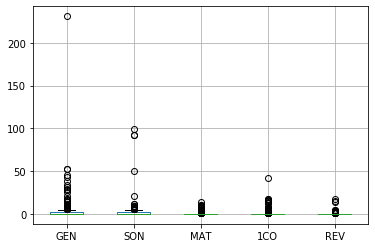

In [17]:
verses_sexual_categories_df.groupby(["bible_book"]).sum().T[["GEN", "SON", "MAT", "1CO", "REV"]].boxplot()

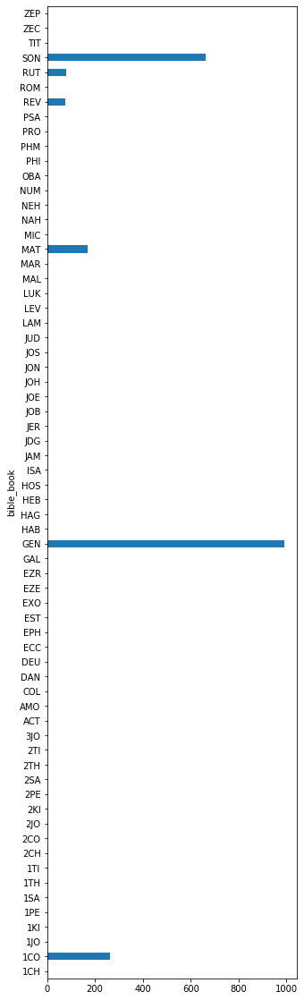

In [18]:
verses_sexual_categories_df.groupby(["bible_book"]).sum().sum(axis=1).plot.barh(figsize=(5,20))

In [43]:
verses_sexual_categories_df.groupby(["bible_book_chapter"]).sum()

,relations,monogamy,poligamy,marriage,second-marriage,second-marriage-divorce,second-marriage-widow,interfaith-marriage,interfaith-relation,non-marital-relation,...,plants,flowers,trees,palms,time,part-of-the-day,night,sunrise,seasons,winter
bible_book_chapter,,,,,,,,,,,,,,,,,,,,,
1CH.001,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1CH.002,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1CH.003,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1CH.004,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1CH.005,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZEC.013,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ZEC.014,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ZEP.001,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


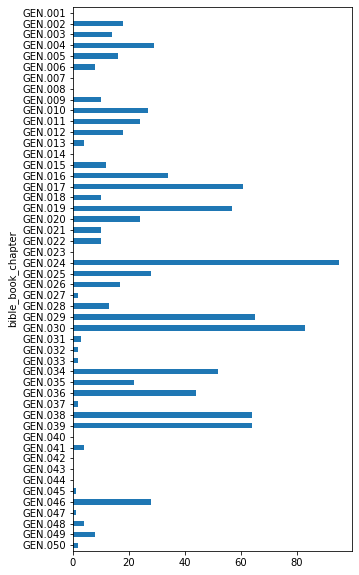

In [32]:
verses_sexual_categories_df.loc[verses_sexual_categories_df["bible_book"].isin(["GEN"])].groupby(["bible_book_chapter"]).sum().sum(axis=1).sort_index(ascending=False).plot.barh(figsize=(5,10))

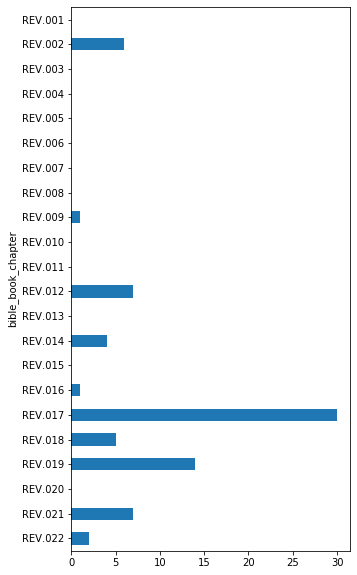

In [33]:
verses_sexual_categories_df.loc[verses_sexual_categories_df["bible_book"].isin(["REV"])].groupby(["bible_book_chapter"]).sum().sum(axis=1).sort_index(ascending=False).plot.barh(figsize=(5,10))

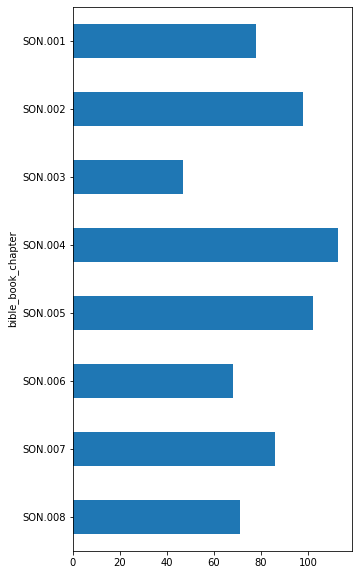

In [34]:
verses_sexual_categories_df.loc[verses_sexual_categories_df["bible_book"].isin(["SON"])].groupby(["bible_book_chapter"]).sum().sum(axis=1).sort_index(ascending=False).plot.barh(figsize=(5,10))

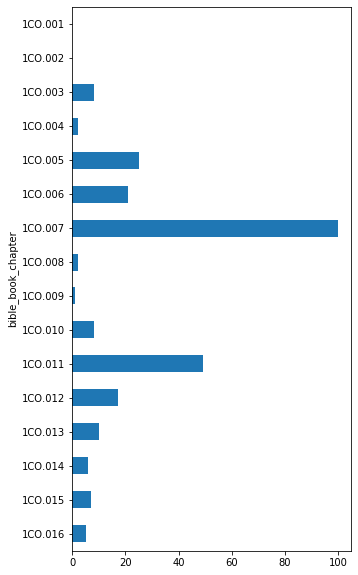

In [35]:
verses_sexual_categories_df.loc[verses_sexual_categories_df["bible_book"].isin(["1CO"])].groupby(["bible_book_chapter"]).sum().sum(axis=1).sort_index(ascending=False).plot.barh(figsize=(5,10))

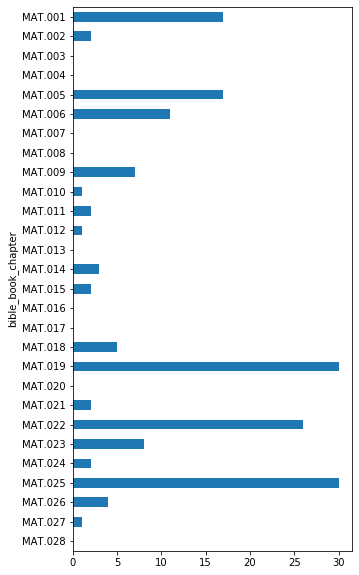

In [42]:
verses_sexual_categories_df.loc[verses_sexual_categories_df["bible_book"].isin(["MAT"])].groupby(["bible_book_chapter"]).sum().sum(axis=1).sort_index(ascending=False).plot.barh(figsize=(5,10))

In [41]:
verses_sexual_categories_df.groupby(["bible_book_chapter"]).sum().sum(axis=1).sort_values().tail(20)

bible_book_chapter
GEN.016     34
GEN.036     44
SON.003     47
1CO.011     49
GEN.034     52
GEN.019     57
GEN.017     61
GEN.038     64
GEN.039     64
GEN.029     65
SON.006     68
SON.008     71
SON.001     78
GEN.030     83
SON.007     86
GEN.024     95
SON.002     98
1CO.007    100
SON.005    102
SON.004    113
dtype: int64

In [21]:
verses_sexual_themes[0:10]

[['#b.GEN.2.7', 'blessed-aspect'],
 ['#b.GEN.2.21', 'blessed-aspect'],
 ['#b.GEN.2.21', 'rib'],
 ['#b.GEN.2.21', 'sleep'],
 ['#b.GEN.2.22', 'blessed-aspect'],
 ['#b.GEN.2.22', 'rib'],
 ['#b.GEN.2.22', 'sleep'],
 ['#b.GEN.2.23', 'body'],
 ['#b.GEN.2.23', 'women'],
 ['#b.GEN.2.23', 'men']]

In [15]:
verses_sexual_categories_df

,relations,monogamy,poligamy,marriage,second-marriage,second-marriage-divorce,second-marriage-widow,interfaith-marriage,interfaith-relation,non-marital-relation,...,plants,flowers,trees,palms,time,part-of-the-day,night,sunrise,seasons,winter
b.GEN.1.1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
b.GEN.1.2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
b.GEN.1.3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
b.GEN.1.4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
b.GEN.1.5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b.REV.22.17,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
b.REV.22.18,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
b.REV.22.19,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
b.REV.22.20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [20]:
print(etree.tostring(documento_root_taxonomy, pretty_print=True, encoding="unicode"))

<teiCorpus xmlns="http://www.tei-c.org/ns/1.0">
	<teiHeader>
		<fileDesc>
			<titleStmt>
				<title>Biblia</title>
				<title type="idno">
					<idno type="viaf"/>
				</title>
				<author>
					<name type="short">varios</name>
					<name type="full">varios</name>
					<idno type="viaf"/>
				</author>
				<principal xml:id="jct">José Calvo Tello</principal>
			</titleStmt>
			<publicationStmt>
				<publisher/>
				<availability status="free">
					<p>The text is freely available.</p>
				</availability>
				<date when="2015">2015</date>
			</publicationStmt>
			<sourceDesc>
				<bibl type="print-source">Reina Valera, <date when="1995">1995</date></bibl>
				<bibl type="edition-first"><date when="1569">1569</date></bibl>
			</sourceDesc>
		</fileDesc>
		<encodingDesc>
			<p/>
		</encodingDesc>
		<revisionDesc>
			<change when="2015-01-08" who="#jct">Finished first version of Matthew.</change>
			<change when="2015-12-30" who="#jct">Created schema and changed some elements.</change>
			

In [10]:
documento_root.xpath('.//tei:standOff//tei:span[./tei:certainty/@cert="high" or ./tei:certainty/@cert="medium"]/@ana', namespaces = specific_namespaces, with_tail = True)[0:10]

['blessed-aspect',
 'blessed-aspect',
 'rib',
 'sleep',
 'blessed-aspect',
 'rib',
 'sleep',
 'body',
 'women',
 'men']

In [39]:
for verse in documento_root.xpath('.//tei:ab[@type="verse"]', namespaces = specific_namespaces, with_tail = True)[0:100]:
    #print(verse.xpath("./@xml:id", namespaces = specific_namespaces))
    verse_str = str(etree.tostring(verse))
    #print(type(verse_str))
    verse_str = re.sub(r"(\\t|\\n)+", r"", verse_str, flags=re.DOTALL)
    verse_str = re.sub(r'<ab xmlns="http://www.tei-c.org/ns/1.0" .*?>', r"", verse_str)
    verse_str = re.sub(r'</.*?>', r"", verse_str)
    verse_str = re.sub(r'<(.*?)"(.*?)"(.*?)>', r"<\1\2\3>", verse_str)

    verse_str = re.sub(r'<', r"_", verse_str)
    verse_str = re.sub(r'(key|who|toWhom|type)=', r"@\1 ", verse_str)
    
    verse_str = re.sub(r'>', r" ", verse_str)
    #print(verse_str)



['b.GEN.1.1']
<class 'str'>
b'En el _rs @key #tim3 principio cre&#243; _rs @key #per14 Dios los cielos y la _rs @key #pla41 tierra.'
['b.GEN.1.2']
<class 'str'>
b'La _rs @key #pla41 tierra estaba desordenada y vac&#237;a, las tinieblas estaban sobre la faz del abismo y el _rs @key #per17 cert="low" esp&#237;ritu de _rs @key #per14 Dios se mov&#237;a sobre la faz de las aguas.'
['b.GEN.1.3']
<class 'str'>
b'Dijo _rs @key #per14 Dios _q @who #per14 @toWhom "#org0" @type "oral" Sea la luz. Y fue la luz.'
['b.GEN.1.4']
<class 'str'>
b'Vio _rs @key #per14 Dios que la luz era buena, y separ&#243; la luz de las tinieblas.'
['b.GEN.1.5']
<class 'str'>
b'Llam&#243; a la luz _q @who #per14 @toWhom "#org0" @type "oral" cert="low" D&#237;a, y a las tinieblas llam&#243; _q @who #per14 @toWhom "#org0" @type "oral" cert="low" Noche. Y fue la tarde y la ma&#241;ana del primer _rs @key #tim3 d&#237;a.'
['b.GEN.1.6']
<class 'str'>
b'Luego dijo _rs @key #per14 Dios _q @who #per14 @toWhom "#org0" @type "o

In [8]:
verses

['b.GEN.1.1',
 'b.GEN.1.2',
 'b.GEN.1.3',
 'b.GEN.1.4',
 'b.GEN.1.5',
 'b.GEN.1.6',
 'b.GEN.1.7',
 'b.GEN.1.8',
 'b.GEN.1.9',
 'b.GEN.1.10',
 'b.GEN.1.11',
 'b.GEN.1.12',
 'b.GEN.1.13',
 'b.GEN.1.14',
 'b.GEN.1.15',
 'b.GEN.1.16',
 'b.GEN.1.17',
 'b.GEN.1.18',
 'b.GEN.1.19',
 'b.GEN.1.20',
 'b.GEN.1.21',
 'b.GEN.1.22',
 'b.GEN.1.23',
 'b.GEN.1.24',
 'b.GEN.1.25',
 'b.GEN.1.26',
 'b.GEN.1.27',
 'b.GEN.1.28',
 'b.GEN.1.29',
 'b.GEN.1.30',
 'b.GEN.1.31',
 'b.GEN.2.1',
 'b.GEN.2.2',
 'b.GEN.2.3',
 'b.GEN.2.4',
 'b.GEN.2.5',
 'b.GEN.2.6',
 'b.GEN.2.7',
 'b.GEN.2.8',
 'b.GEN.2.9',
 'b.GEN.2.10',
 'b.GEN.2.11',
 'b.GEN.2.12',
 'b.GEN.2.13',
 'b.GEN.2.14',
 'b.GEN.2.15',
 'b.GEN.2.16',
 'b.GEN.2.17',
 'b.GEN.2.18',
 'b.GEN.2.19',
 'b.GEN.2.20',
 'b.GEN.2.21',
 'b.GEN.2.22',
 'b.GEN.2.23',
 'b.GEN.2.24',
 'b.GEN.2.25',
 'b.GEN.3.1',
 'b.GEN.3.2',
 'b.GEN.3.3',
 'b.GEN.3.4',
 'b.GEN.3.5',
 'b.GEN.3.6',
 'b.GEN.3.7',
 'b.GEN.3.8',
 'b.GEN.3.9',
 'b.GEN.3.10',
 'b.GEN.3.11',
 'b.GEN.3.12',
 'b.GEN